# EID 444 Homework 3

# Modified Displacement Function (w/ Shift function))

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display
import matplotlib as mpl
mpl.rcParams.update({'font.size': 12})


def shift(R, L):
    '''Adding periodic boundary conditions'''
    R = R - np.round(R/L) * L
    return R


#[1] https://stackoverflow.com/questions/29241056/how-do-i-use-np-newaxis

#R is a matrix of particle positions for N L-J particles

def displacements(R, L):
    '''Calculates all displacements between all pairs 
    of particles'''

    #Wrapping positions under periodic boundary conditions

    R = shift(R,L)

    #Computes the pairwise displacements: r_i - r_j
    #[1] - Learned about np.newaxis to help conduct matrix operations without consuming much memory
    dR = R[:, np.newaxis, :] - R[np.newaxis, :, :]
 
    return dR


# LJ Forces Function

In [2]:
def lj_forces(dR, sigma, epsilon):

     rij = np.linalg.norm(dR, axis=-1)
     FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation
     FRR[np.isnan(FRR)] = 0 #Shown to me by Jared

     return FRR


# Net Forces

In [3]:
def net_forces(FRR):
    FR = np.nansum(FRR, axis=1) #Shown to me by Jared. Had an issue where I could not get rid of nan values
    return FR

# Verlet Step

In [4]:
def verlet_step(r_current, r_prev, t, m, FR):
    """ Calculate the Verlet step of the Leonard-Jones particle system. """

    acceleration = FR / m[:, np.newaxis]  

    r_next = (2 * r_current) - r_prev + (acceleration * (t**2))

    return r_next 



# Simulation

In [7]:
#Credit to Jared for telling me to create a function that combines all previous functions


def Force_from_displacement(R, sigma, epsilon, L):
    dR = displacements(R, L)
    Forces = lj_forces(dR, sigma, epsilon)
    net_force = np.nansum(Forces[..., np.newaxis] * dR, axis=0) 
    net_force[np.isnan(net_force)] = 0
    return net_force


def simulation(R_0, v_0, m, t, t_max, sigma, epsilon, L):
    n_steps = int(t_max / t)
    N = len(R_0)

    #Initialize trajectory correctly as a NumPy array
    trajectory = np.zeros((n_steps, N, 2))

    #Set initial positions
    trajectory[0] = R_0
    trajectory[1] = R_0 + v_0 * t  # First Verlet step

    for step in range(1, n_steps - 1):
        #Compute forces
        FR = Force_from_displacement(trajectory[step], sigma, epsilon, L)
        
        #Compute next position using Verlet integration
        r_next = verlet_step(trajectory[step], trajectory[step - 1], t, m, FR)
        
        #Store new positions
        trajectory[step + 1] = r_next

    return trajectory 


# Plot and Animate Trajectory

In [6]:
def plot_traj(trajectory):

    trajectory = np.array(trajectory)  

    N = trajectory.shape[1] 

    for i in range(N):
        plt.plot(trajectory[:, i, 0], trajectory[:, i, 1], marker='o')

    plt.xlabel("X Position")
    plt.ylabel("Y Position")
    plt.title("Particle Trajectories")
    plt.axis("equal")
    plt.show()


def animate_trajectory(trajectory, interval=50, stride = 5):

    trajectory = np.array(trajectory) 
    n_steps, N, _ = trajectory.shape 

    #Create figure and axis
    fig, ax = plt.subplots(figsize=(6, 6), dpi=100)
    ax.set_xlim(np.min(trajectory[..., 0]) - 1, np.max(trajectory[..., 0]) + 1)
    ax.set_ylim(np.min(trajectory[..., 1]) - 1, np.max(trajectory[..., 1]) + 1)
    ax.set_title("Leonard-Jones Particle Simulation")
    ax.set_xlabel("X Position")
    ax.set_ylabel("Y Position")

    #Initialize scatter plot
    scat = ax.scatter([], [], s=100)


    #[2] https://stackoverflow.com/questions/26892392/how-to-use-funcanimation-to-display-one-scatter-marker-per-frame
    def init():
        """Initialize animation frame with empty data."""
        scat.set_offsets(np.zeros((N, 2)))  # Set initial positions as empty
        return scat,

    def update(frame):
        """Update scatter plot for each frame."""
        positions = trajectory[frame] 
        scat.set_offsets(positions)  # Update particle positions
        return scat,

    #Create animation
    ani = animation.FuncAnimation(fig, update, frames=range(0, n_steps, stride), init_func=init, interval=interval, blit=True)
    ani.save('trajectory.gif', writer='pillow')

    return HTML(ani.to_jshtml())



# Testing 2 Particles where Forces are Zero (Question 2)

In [ ]:
sigma = 1.0
epsilon = 1.0
r_min = (2**(1/6)) * sigma

#Question 2a for HW4
R1 = np.array([[-0.5 * r_min, 0], [0.5 * r_min,0]]) 
L1 = 3
FR1 = Force_from_displacement(R1, sigma, epsilon, L1)

print(f' Net force of Case 1: {FR1}')

#Question 2b for HW4
R2 = np.array([[-r_min * (1/(2*(np.sqrt(2)))),-r_min * (1/(2*(np.sqrt(2))))], [r_min * (1/(2*(np.sqrt(2)))), r_min * (1/(2*(np.sqrt(2))))]])
L2 = 2
FR2 = Force_from_displacement(R2, sigma, epsilon, L2)

print(f'Net force of Case 2: {FR2}')



 Net force of Case 1: [[ 1.99389314e-15  0.00000000e+00]
 [-1.99389314e-15  0.00000000e+00]]
Net force of Case 2: [[-1.12791629e-14 -1.12791629e-14]
 [ 1.12791629e-14  1.12791629e-14]]


C:\Users\mo241\AppData\Local\Temp\ipykernel_8648\4205053979.py:4: RuntimeWarning: divide by zero encountered in divide
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation
C:\Users\mo241\AppData\Local\Temp\ipykernel_8648\4205053979.py:4: RuntimeWarning: invalid value encountered in add
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation


# Question 3a

C:\Users\mo241\AppData\Local\Temp\ipykernel_8648\4205053979.py:4: RuntimeWarning: divide by zero encountered in divide
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation
C:\Users\mo241\AppData\Local\Temp\ipykernel_8648\4205053979.py:4: RuntimeWarning: invalid value encountered in add
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation


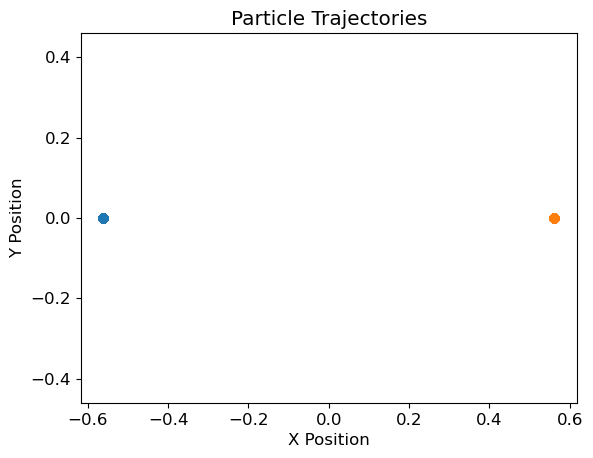

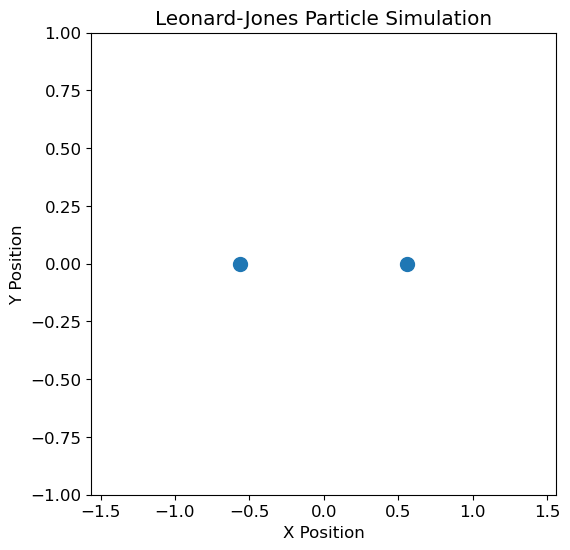

In [ ]:
r_min = (2**(1/6)) * sigma


#Might need to fix animate function so it represents the box - set xlim and ylim correctly
#Animation must be bounded by the box


#Question 3a
R1 = np.array([[-0.5 * r_min, 0], [0.5 * r_min,0]]) 
v0 = np.array([[0,0],[0,0]])
traj1 = simulation(R1, v0, np.ones(len(R1)), .01, 10, 1, 1, 3)
plot_traj(traj1)
animate_trajectory(traj1)


# Question 3b

C:\Users\mo241\AppData\Local\Temp\ipykernel_8648\4205053979.py:4: RuntimeWarning: divide by zero encountered in divide
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation
C:\Users\mo241\AppData\Local\Temp\ipykernel_8648\4205053979.py:4: RuntimeWarning: invalid value encountered in add
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation


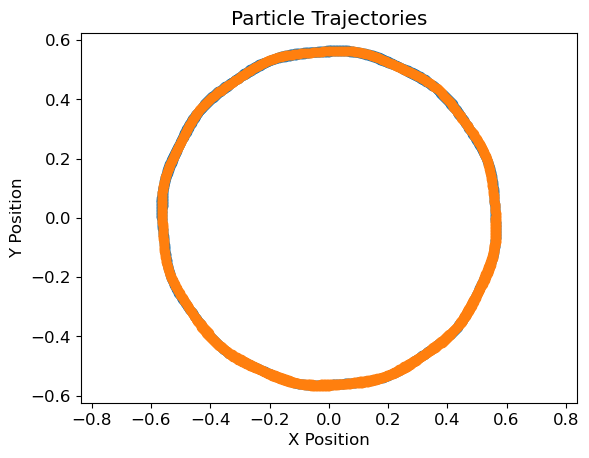

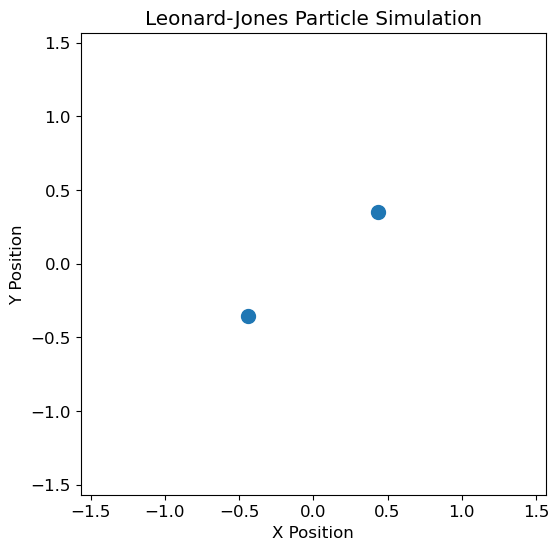

In [13]:
#Question 3b
R2 = np.array([[-0.5 * r_min, 0], [0.5 * r_min,0]]) 
v1 = np.array([[0,0.5],[0,-0.5]])
traj2= simulation(R2, v1, np.ones(len(R2)), .01, 10, 1, 1, 3)
plot_traj(traj2)
animate_trajectory(traj2)

# Question 4

C:\Users\mo241\AppData\Local\Temp\ipykernel_8648\4205053979.py:4: RuntimeWarning: divide by zero encountered in divide
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation
C:\Users\mo241\AppData\Local\Temp\ipykernel_8648\4205053979.py:4: RuntimeWarning: invalid value encountered in add
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation


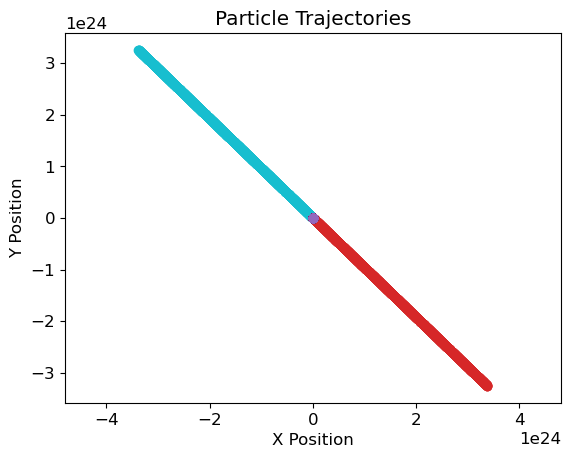

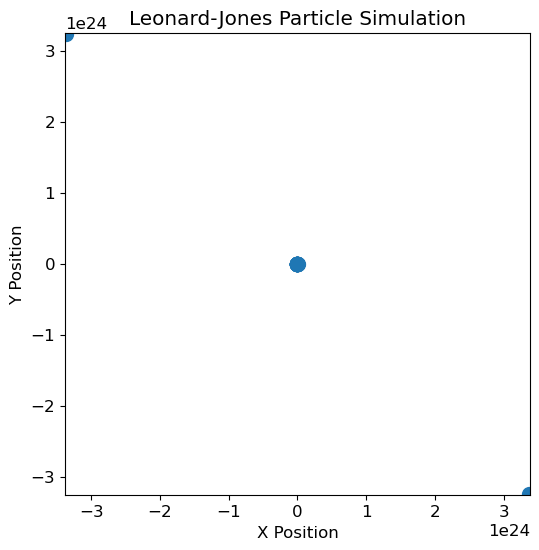

In [14]:
def make_triangular_lattice(origin, N, lattice_constant):
  lattice = np.zeros((N*N,2))
  for i in range(N):
    for j in range(N):
      lattice[i*N + j] = origin + i*np.array([1,0]) + j*np.array([0.5, np.sqrt(3/4)])

  lattice = lattice_constant*(lattice - np.mean(lattice, axis = 0))
  return lattice

#Question 4a

#Professor Sharma's setup code for triangular lattice
N=5
masses = np.ones(N*N)
positions = make_triangular_lattice(np.array([0,0]), N, 2**(1/6))
v_max = 2
np.random.seed(20)
velocities = v_max*2*(np.random.rand(N*N,2)-0.5)

T=simulation(R_0 = positions, v_0 = velocities, m = masses, t=0.01, t_max=10, sigma=1, epsilon = 1, L=3 )
plot_traj(T)
animate_trajectory(T)